In [1]:
import os, sys, time
import cv2
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

from utilities import images_ready, more_tests, get_model, save_crop, detect_beard, detect_shades

In [2]:
test_dir = "data/deepfake-detection-challenge/test_videos/"

In [3]:
# Get the file name of all the videos.
test_videos = sorted([x for x in os.listdir(test_dir) if x[-4:] == ".mp4"]) 
# Get the device, if gpu and cuda is available for faster processing. 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [4]:
import sys
cwd = os.getcwd()
sys.path.insert(0,cwd + "/imports/blazeface")
sys.path.insert(0,cwd +  "/imports/inference")
print(sys.version)

3.8.10 (default, Jun  2 2021, 10:49:15) 
[GCC 9.4.0]


In [5]:
from blazeface import BlazeFace

In [6]:
# Load blazeface training weights
facedet = BlazeFace().to(device)
facedet.load_weights(cwd + "/imports/blazeface/blazeface.pth")
facedet.load_anchors(cwd + "/imports/blazeface/anchors.npy")
_ = facedet.train(False)

In [7]:
from helpers.read_video_1 import VideoReader
from helpers.face_extract_1 import FaceExtractor

frames_per_video = 150

video_reader = VideoReader()
video_read_fn = lambda x: video_reader.read_frames(x, num_frames=frames_per_video)
face_extractor = FaceExtractor(video_read_fn, facedet)

In [8]:
input_size =224 

In [9]:
# All pre-trained models expect input images normalized in the same way, i.e.
# mini-batches of 3-channel RGB videos of shape (3 x T x H x W), 
# where H and W are expected to be 112, and T is a number of video frames in a clip. 
# The images have to be loaded in to a range of [0, 1] and then normalized using mean = 
# [0.43216, 0.394666, 0.37645] and std = [0.22803, 0.22145, 0.216989].

In [10]:
# Here we normalize the image
from torchvision.transforms import Normalize

mean = [0.43216, 0.394666, 0.37645]
std = [0.22803, 0.22145, 0.216989]
normalize_transform = Normalize(mean,std)

In [11]:
# Here we use opencv to resize the image isotropically so that it does not go out of dimension.
def isotropically_resize_image(img, size, resample=cv2.INTER_AREA):
    h, w = img.shape[:2]
    if w > h:
        h = h * size // w
        w = size
    else:
        w = w * size // h
        h = size

    resized = cv2.resize(img, (w, h), interpolation=resample)
    return resized

# here we use opencv to make the frame square.
def make_square_image(img):
    h, w = img.shape[:2]
    size = max(h, w)
    t = 0
    b = size - h
    l = 0
    r = size - w
    return cv2.copyMakeBorder(img, t, b, l, r, cv2.BORDER_CONSTANT, value=0)

In [12]:
import torch.nn as nn
import torchvision.models as models

class MyResNeXt(models.resnet.ResNet):
    def __init__(self, training=True):
        super(MyResNeXt, self).__init__(block=models.resnet.Bottleneck,
                                        layers=[3, 4, 6, 3], 
                                        groups=32, 
                                        width_per_group=4)
        self.fc = nn.Linear(2048, 1)

In [13]:
checkpoint = torch.load(cwd + "/imports/inference/resnext.pth", map_location=device)

model = MyResNeXt().to(device)
model.load_state_dict(checkpoint)
_ = model.eval()

del checkpoint

In [14]:
input_size = 224

In [15]:
def blink_on_video(video_path, batch_size, model):
    # Find the faces for N frames in the video.
    faces = face_extractor.process_video(video_path)
    face_extractor.keep_only_best_face(faces)
    all_open=0
    all_closed=0
    if len(faces) > 0:
        for frame_data in faces:
            for face in frame_data["faces"]:
                resized_face = isotropically_resize_image(face, input_size)
                resized_face = make_square_image(resized_face)
                plt.imshow(resized_face, interpolation='nearest')
                file_name_save='eyeblink data labels/data/temp/o.png'
                plt.savefig(file_name_save)
                file_name_save_2='eyeblink data labels/data/temp/p.png'
                save_crop('o.png', 'p.png','eyeblink data labels/data/temp/')
                current=more_tests(model, 'eyeblink data labels/data/temp')
                if current==1:
                    all_open+=1
                else:
                    all_closed+=1
                plt.show()
    if (all_open+all_closed)!=batch_size:
        print("A face wasn't detected on every frame.\nAmount of classified frames not equal to batch size.")
    print("The model predicts",(all_open/(all_open+all_closed))*100,"% of the frames are eyes open.")
    print("The model predicts",100-((all_open/(all_open+all_closed))*100),"% of the frames are eyes closed.")

In [16]:
def predict_on_video(video_path, batch_size):
    try:
        # Find the faces for N frames in the video.
        faces = face_extractor.process_video(video_path)
        face_extractor.keep_only_best_face(faces)
        
        if len(faces) > 0:
            x = np.zeros((batch_size, input_size, input_size, 3), dtype=np.uint8)
            n = 0
            for frame_data in faces:
                for face in frame_data["faces"]:
                    # print("Before resize")
                    # plt.imshow(face, interpolation='nearest')
                    # plt.show()
                    print("After Resize")
                    resized_face = isotropically_resize_image(face, input_size)
                    resized_face = make_square_image(resized_face)
                    # print(resized_face)
                    plt.imshow(resized_face, interpolation='nearest')
                    plt.show()

                    if n < batch_size:
                        x[n] = resized_face
                        n += 1
                    else:
                        print("WARNING: have %d faces but batch size is %d" % (n, batch_size))

            if n > 0:
                x = torch.tensor(x, device=device).float()
                x = x.permute((0, 3, 1, 2))

                for i in range(len(x)):
                    x[i] = normalize_transform(x[i] / 255.)
                with torch.no_grad():
                    y_pred = model(x)
                    y_pred = torch.sigmoid(y_pred.squeeze())
                    return y_pred[:n].mean().item()

    except Exception as e:
        print("Prediction error on video %s: %s" % (video_path, str(e)))

    return 0.5

In [17]:
#used to run all the files
fullvideospath = []
for i in range(0,len(test_videos)):
    temp = cwd + "/" + test_dir  +  test_videos[i]
    fullvideospath.append(temp)
    #print(temp)

In [18]:
frames_per_video

150

In [19]:
# runtime: 3 minutes
model=get_model()
# load df from csv
eyes_df = pd.read_csv("libraries and test data/data for model tests/All Labels/eyeblinks.csv", header=0)
# eyes_df.groupby('Gender')['Gender'].count()
eyes_df

,Name,Length,Race,Gender,Distribution,# of Frames Wrong,Incorrect Side
0,blink01.mp4,7111856,White,M,"Its 86.00% open, 14.00% closed. Total of 150 f...",11.0,06 - Closed
1,blink02.mp4,3205862,White,M,"Its 20.67% open, 79.33% closed. Total of 150 f...",78.0,78 - Closed
2,blink03.mp4,2749710,White,F,"Its 83.33% open, 16.67% closed. Total of 150 f...",15.0,12 - Closed
3,blink04.mp4,1755649,Non-White,M,"Its 92.67% open, 7.33% closed. Total of 150 fr...",13.0,10 - Closed
4,blink05.mp4,12861533,White,M,"Its 84.67% open, 15.33% closed. Total of 150 f...",21.0,13 - Closed
5,blink06.mp4,7787281,Non-White,M,"Its 27.33% open, 72.67% closed. Total of 150 f...",87.0,81 - Closed
6,blink07.mp4,3965070,Non-White,F,"Its 68.00% open, 32.00% closed. Total of 150 f...",10.0,7 - Closed
7,blink08.mp4,1732330,White,F,"Its 99.33% open, 00.67% closed. Total of 150 f...",0.0,Equal
8,blink09.mp4,3012820,White,M,"Its 92.00% open, 08.00% closed. Total of 150 f...",14.0,14 - Open
9,blink10.mp4,1966659,Non-White,F,NaN,NaN,NaN


In [20]:
eyes_df[['Name']]

,Name
0,blink01.mp4
1,blink02.mp4
2,blink03.mp4
3,blink04.mp4
4,blink05.mp4
5,blink06.mp4
6,blink07.mp4
7,blink08.mp4
8,blink09.mp4
9,blink10.mp4


In [21]:
# manually iterate through each row of the df from the column 'Name'
# manually update the 3 columns
path_to_blink=cwd+"/libraries and test data/data for model tests/Eye Blinks"
temp_vid=9
temp=path_to_blink+'/'+str(eyes_df['Name'].iloc[temp_vid])
print(temp)

/mnt/c/Users/Michael/Desktop/Michael All/VS_Projects/Senior Project II/DFDetect03/libraries and test data/data for model tests/Eye Blinks/blink10.mp4


Eyes closed.


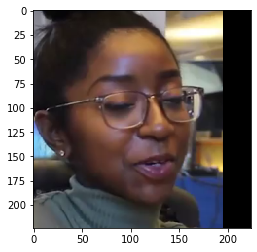

Eyes closed.


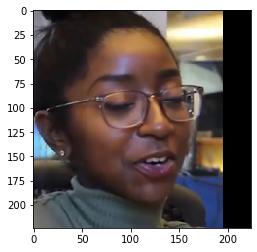

Eyes closed.


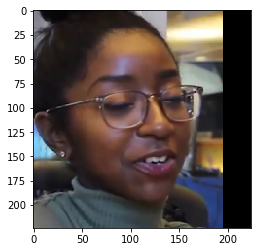

Eyes open.


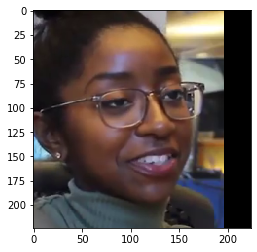

Eyes open.


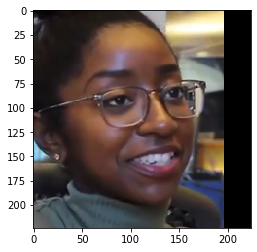

Eyes open.


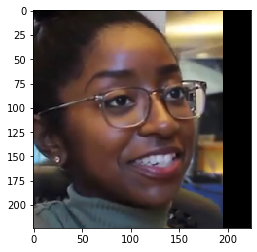

Eyes open.


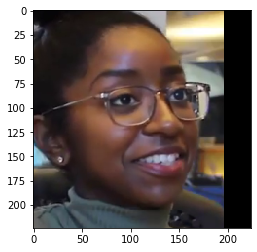

Eyes closed.


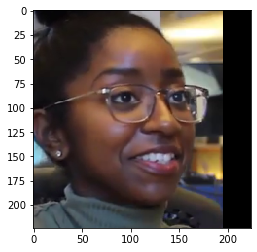

Eyes open.


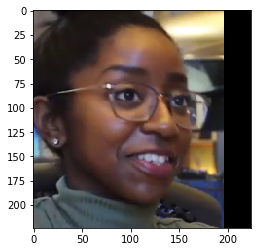

Eyes open.


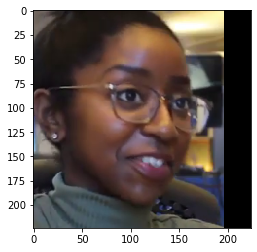

Eyes open.


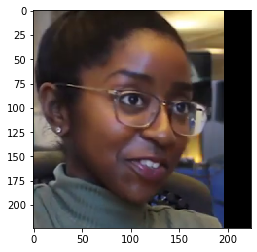

Eyes open.


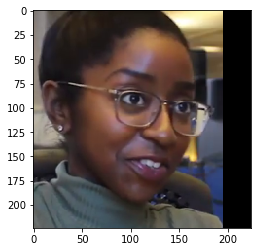

Eyes open.


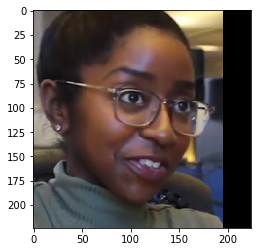

Eyes open.


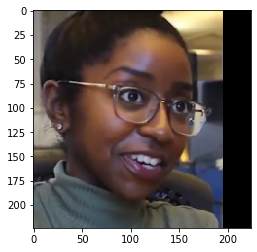

Eyes open.


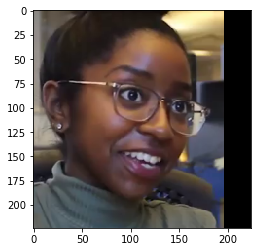

Eyes open.


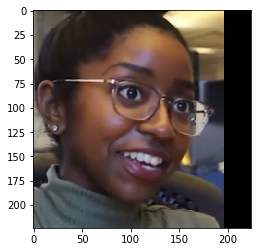

Eyes open.


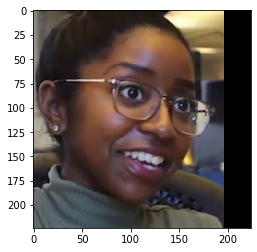

Eyes open.


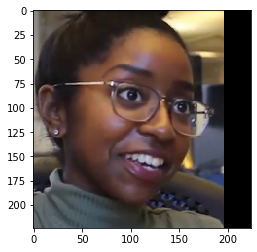

Eyes open.


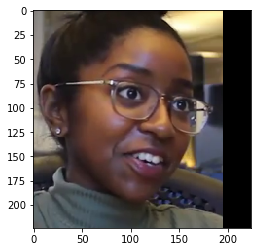

Eyes open.


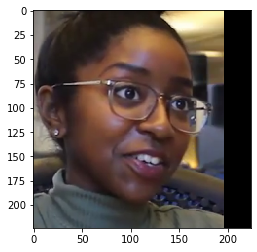

Eyes open.


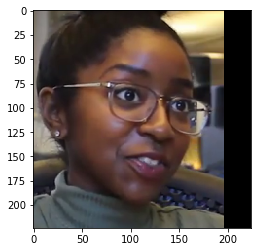

Eyes open.


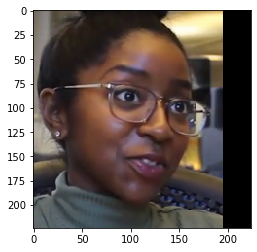

Eyes open.


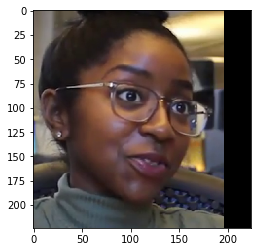

Eyes open.


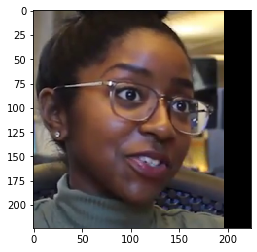

Eyes open.


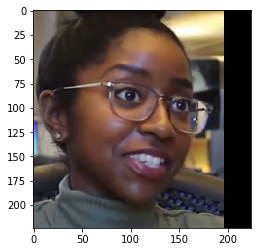

Eyes open.


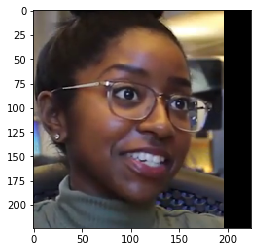

Eyes open.


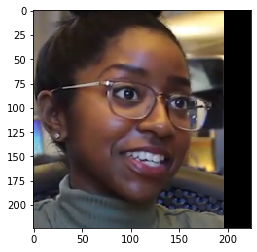

Eyes open.


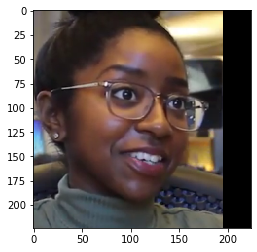

Eyes open.


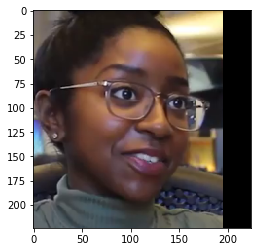

Eyes open.


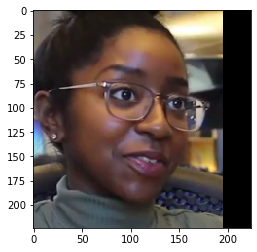

Eyes open.


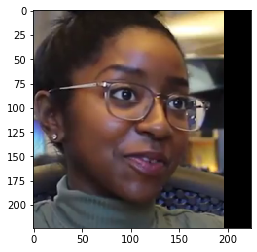

Eyes open.


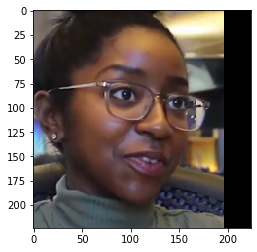

Eyes open.


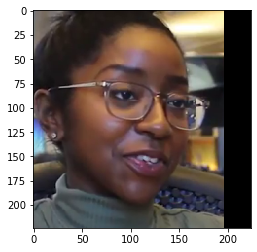

Eyes closed.


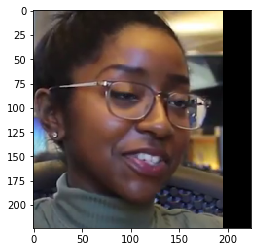

Eyes open.


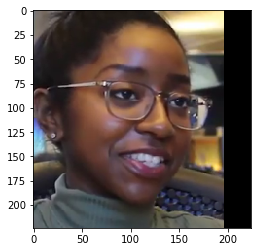

Eyes open.


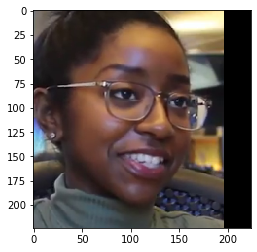

Eyes open.


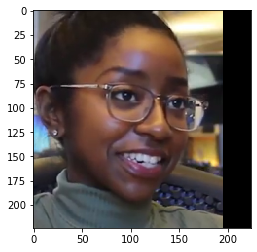

Eyes open.


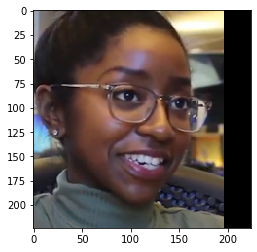

Eyes open.


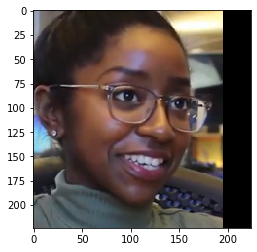

Eyes open.


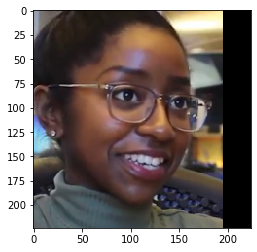

Eyes closed.


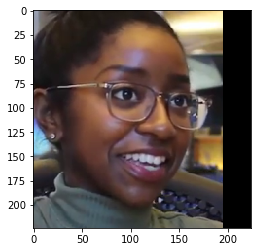

Eyes open.


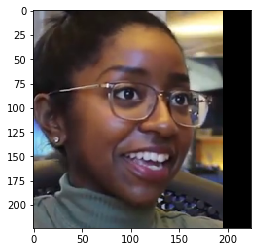

Eyes open.


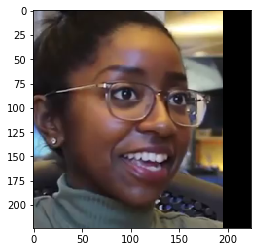

Eyes open.


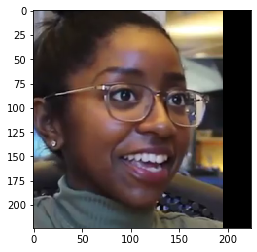

Eyes open.


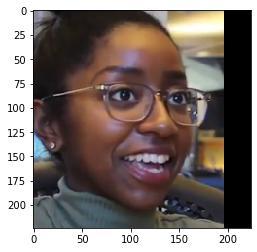

Eyes open.


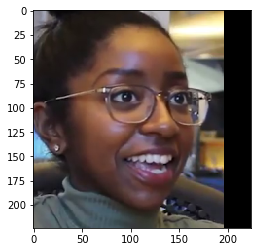

Eyes open.


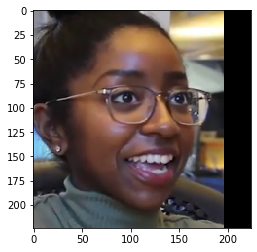

Eyes open.


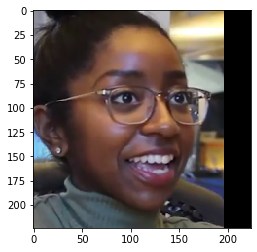

Eyes open.


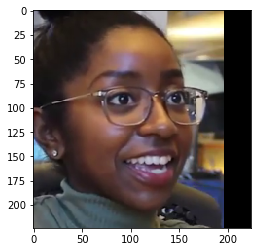

Eyes open.


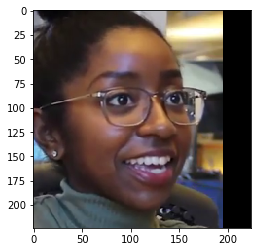

Eyes open.


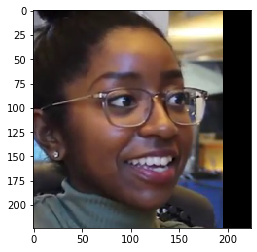

Eyes open.


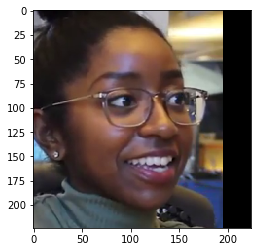

Eyes open.


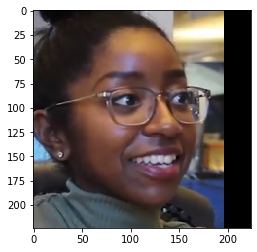

Eyes open.


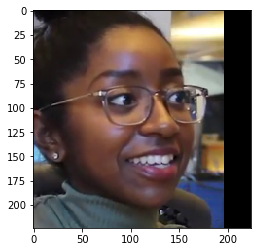

Eyes open.


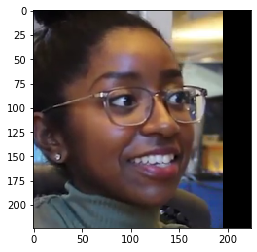

Eyes closed.


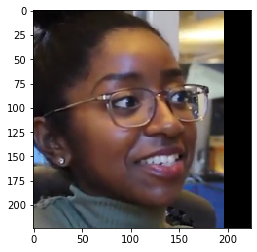

Eyes closed.


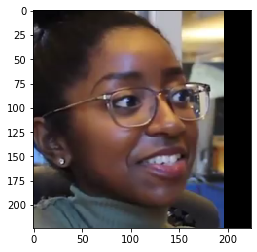

Eyes closed.


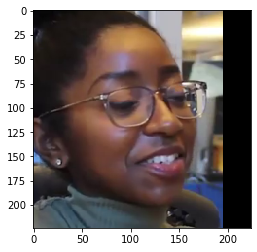

Eyes closed.


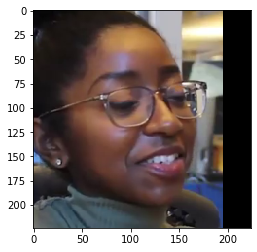

Eyes closed.


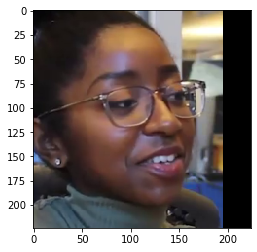

Eyes closed.


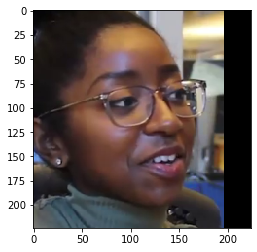

Eyes closed.


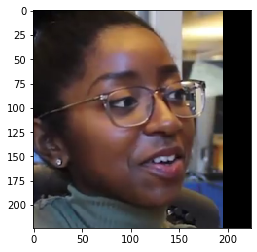

Eyes closed.


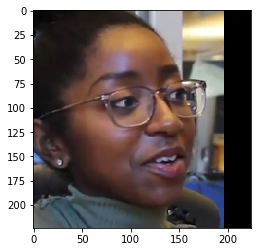

Eyes closed.


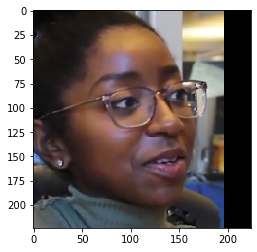

Eyes closed.


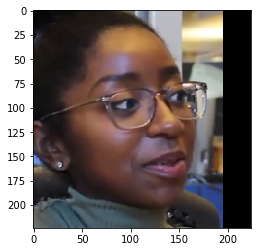

Eyes open.


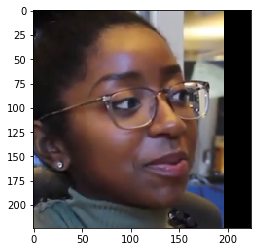

Eyes open.


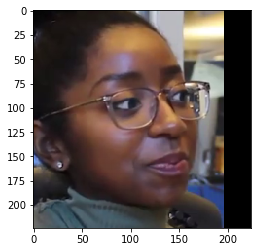

Eyes closed.


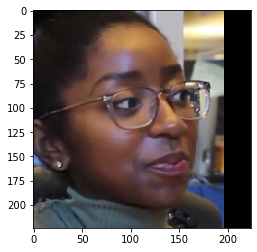

Eyes closed.


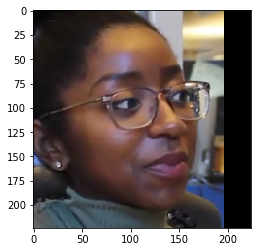

Eyes closed.


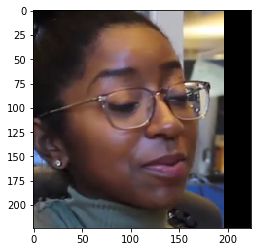

Eyes closed.


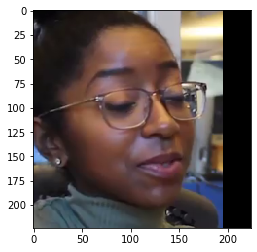

Eyes closed.


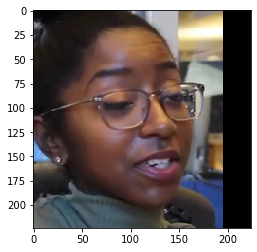

Eyes open.


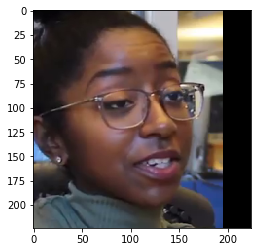

Eyes open.


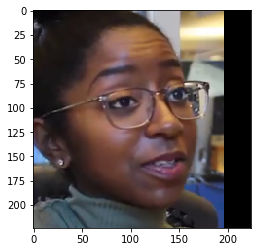

Eyes open.


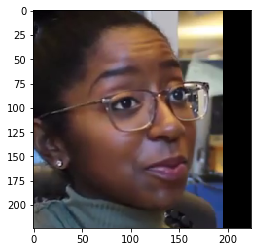

Eyes open.


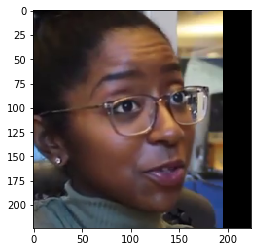

Eyes open.


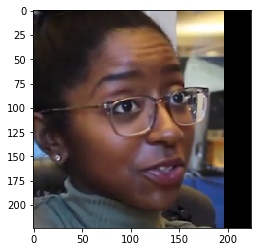

Eyes open.


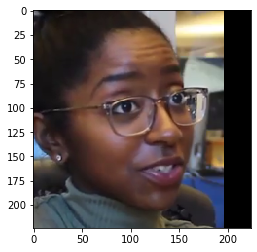

Eyes open.


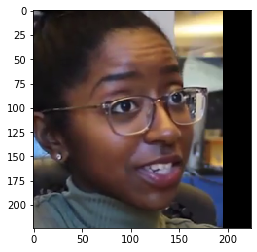

Eyes open.


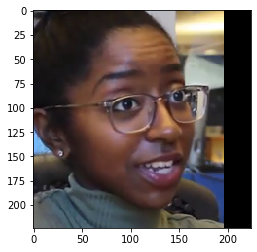

Eyes open.


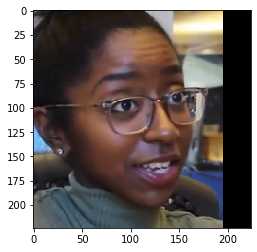

Eyes open.


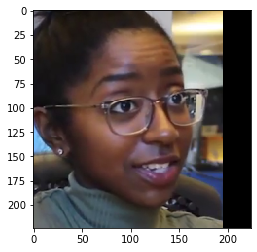

Eyes open.


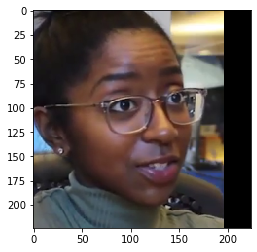

Eyes open.


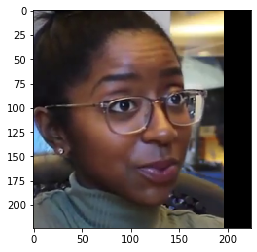

Eyes open.


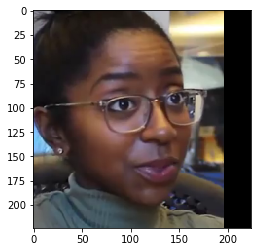

Eyes open.


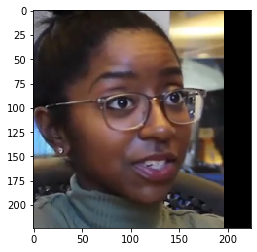

Eyes open.


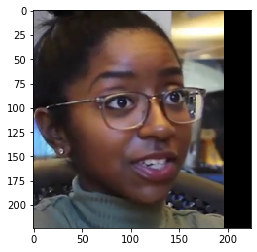

Eyes open.


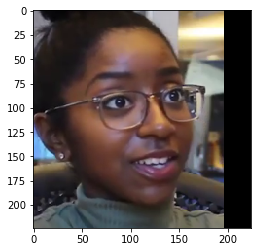

Eyes open.


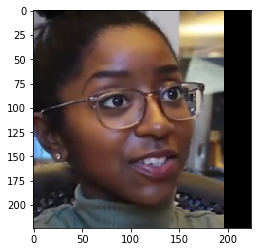

Eyes open.


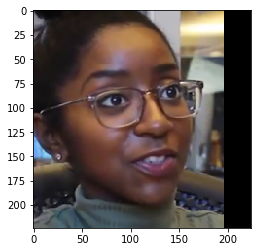

Eyes open.


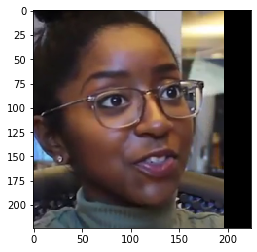

Eyes open.


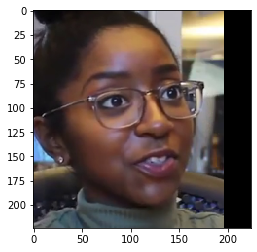

Eyes open.


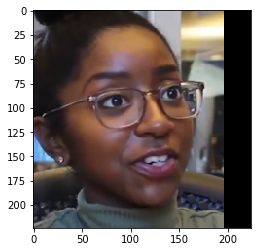

Eyes open.


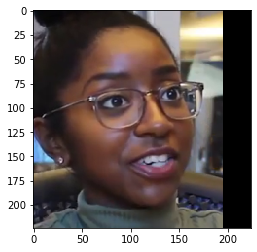

Eyes open.


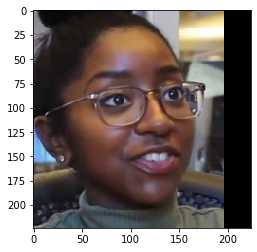

Eyes open.


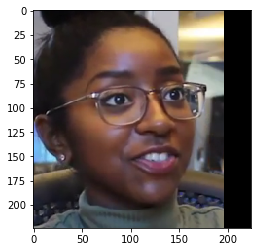

Eyes open.


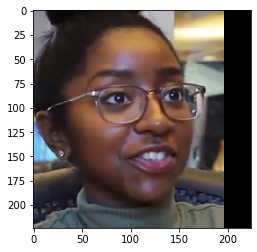

Eyes open.


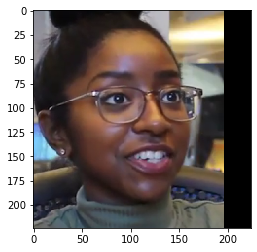

Eyes open.


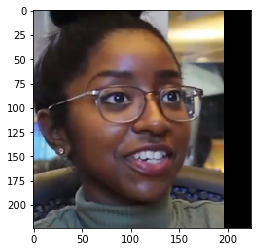

Eyes open.


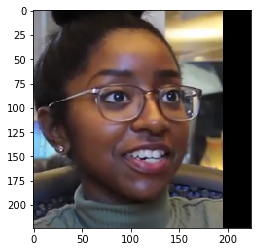

Eyes open.


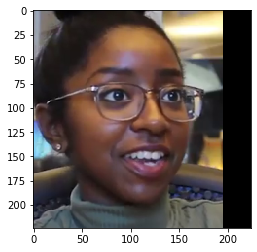

Eyes open.


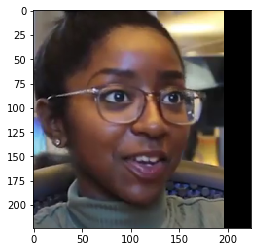

Eyes open.


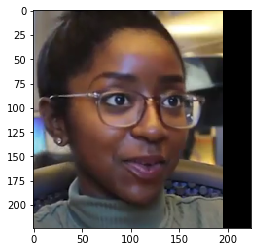

Eyes open.


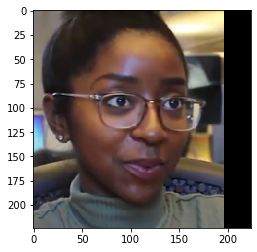

Eyes open.


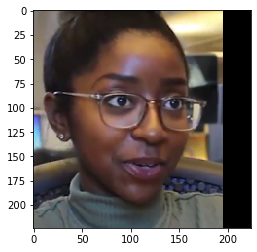

Eyes open.


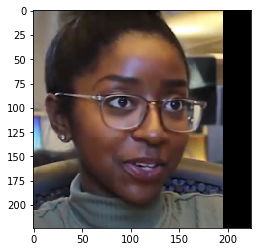

Eyes open.


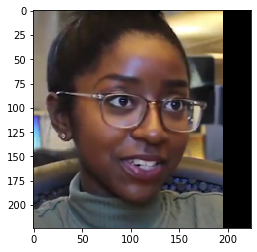

Eyes open.


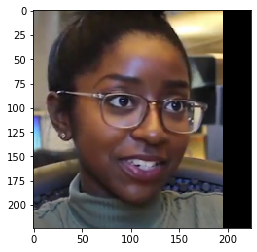

Eyes open.


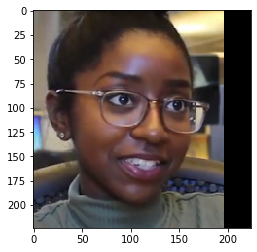

Eyes open.


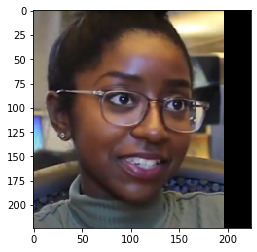

Eyes open.


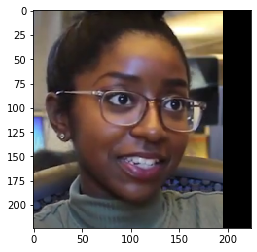

Eyes open.


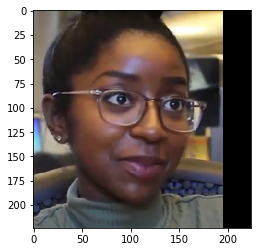

Eyes open.


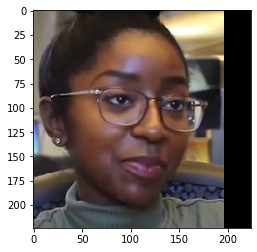

Eyes closed.


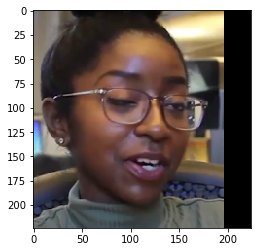

Eyes open.


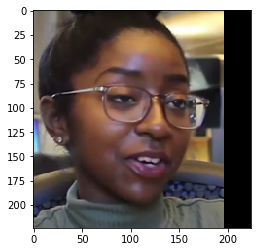

Eyes open.


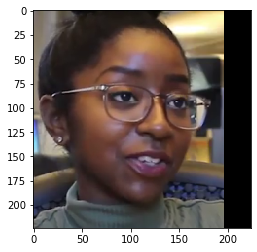

Eyes open.


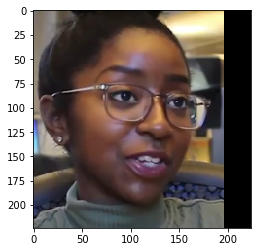

Eyes open.


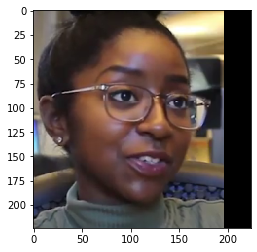

Eyes open.


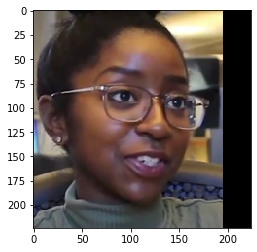

Eyes open.


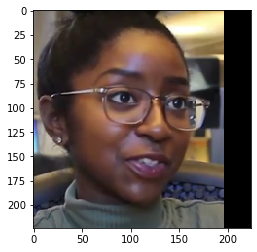

Eyes open.


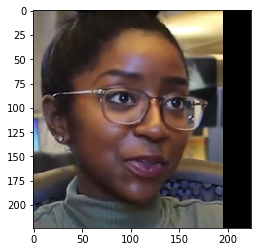

Eyes open.


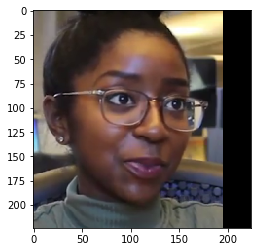

Eyes open.


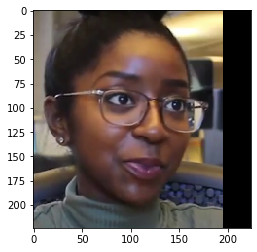

Eyes open.


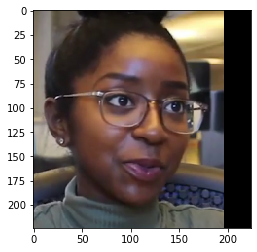

Eyes closed.


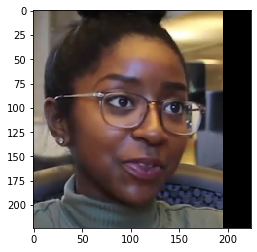

Eyes open.


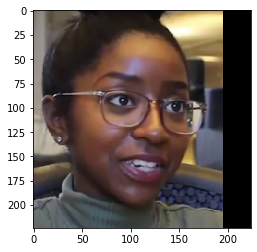

Eyes open.


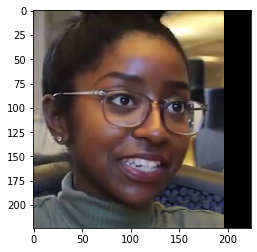

Eyes closed.


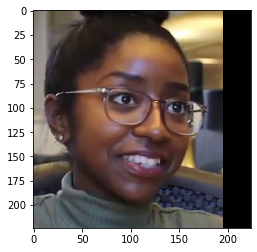

Eyes open.


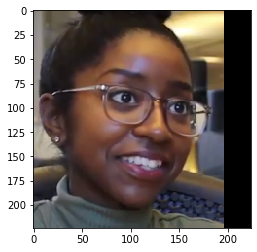

Eyes open.


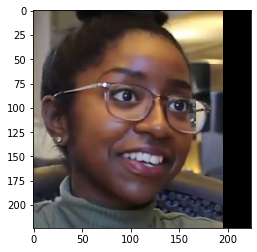

Eyes closed.


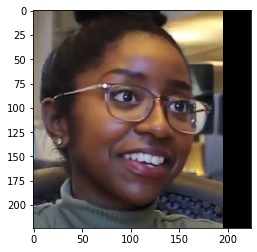

Eyes open.


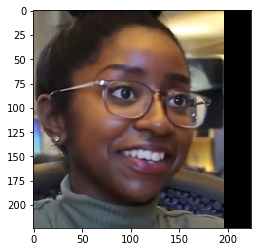

Eyes open.


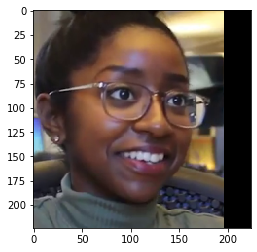

Eyes open.


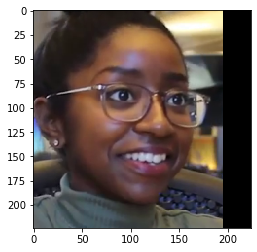

Eyes open.


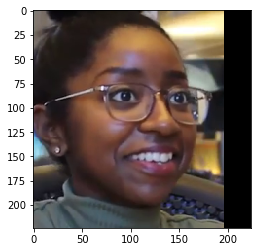

Eyes open.


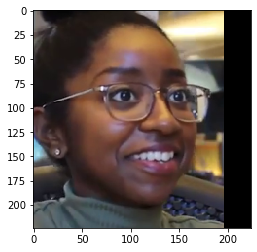

Eyes open.


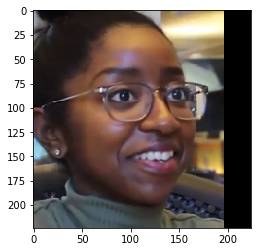

Eyes open.


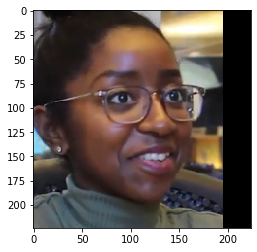

Eyes open.


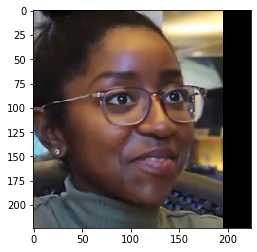

Eyes open.


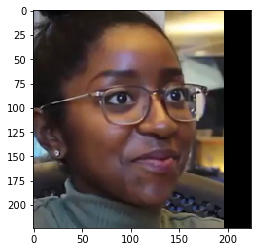

Eyes open.


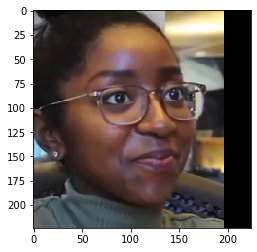

Eyes open.


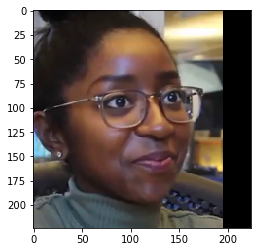

Eyes open.


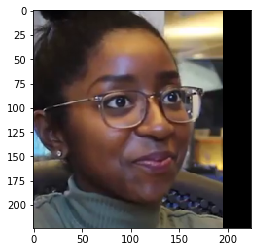

Eyes open.


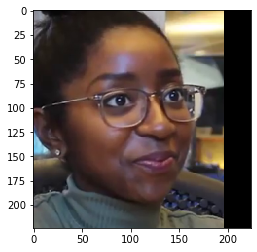

Eyes open.


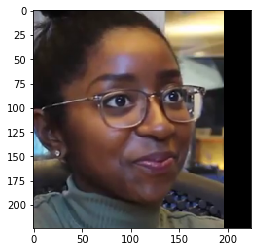

Eyes open.


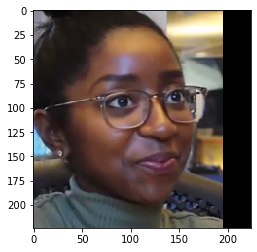

Eyes open.


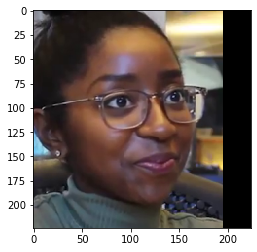

Eyes open.


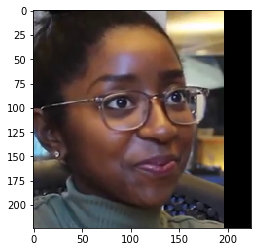

Eyes open.


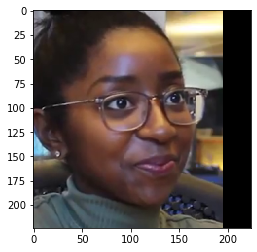

Eyes open.


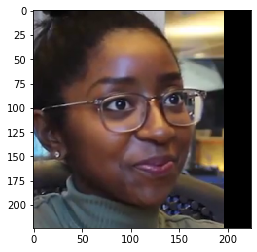

The model predicts 83.33333333333334 % of the frames are eyes open.
The model predicts 16.666666666666657 % of the frames are eyes closed.


In [22]:
blink_on_video(temp, frames_per_video, model)

In [23]:
eyes_df.loc[temp_vid, 'Distribution'] = 'Its 83.33% open, 16.67% closed. Total of 150 frames.'
eyes_df.loc[temp_vid, '# of Frames Wrong'] = 15
eyes_df.loc[temp_vid, 'Incorrect Side'] = '15 - Closed'

In [24]:
# eyes_df.to_csv("libraries and test data/data for model tests/All Labels/eyeblinks.csv", index=False)

In [ ]:
# load df from csv (shades, glasses)
# for loop to iterate through each row of the column 'Name'
# store the printed message in the df through each iteration
# update the csv to be the same as df

In [ ]:
# result_score_1=predict_on_video(fullvideospath[5], frames_per_video)
# print(result_score_1)